## 1. Выбор и описание данных,
База данных - IMDB TMDB Movie Metadata Big Dataset - https://www.kaggle.com/datasets/shubhamchandra235/imdb-and-tmdb-movie-metadata-big-dataset-1mn,

Эта база данных содержит обширное количество информации о фильмах, доступные как на IMDB, так и на TMDB. Этот набор данных, содержащий более 1 млн строк и 42 подробные характеристики, предоставляет подробную информацию о самых разных фильмах, охватывающих различные жанры, периоды и предпосылки производства. В связи с техническими трудностями было выбрано лишь 50 тыс строк для анализа и 20 показателей.

### Задача:
Исследовании тенденций современного кинематографа с помощью инструментов анализа данных.


### Ссылки на исследования:
1. https://rpubs.com/awasthdu/imdb
2. https://habr.com/ru/articles/318330/

## 2. Описание показателей

1. id: уникальный идентификатор для каждого фильма. (число)
2. title: Официальное название фильма. (строка)
3. vote_average: Средняя оценка, полученная фильмом. (число от 0 до 10)
4. vote_count: количество голосов, полученных фильмом. (число >0)
5. status: Текущее состояние фильма (например, выпущен, постпродакшн).
6. revenue: кассовые сборы, полученные от фильма. (число >0)
7. runtime: продолжительность фильма в минутах. (число >0)
8. adult: указывает, предназначен ли фильм для взрослых. (булевое значение)
9. budget: Бюджет, выделенный на фильм. (число >0)
10. original_language: язык оригинала фильма. (строка)
11. popularity: показатель популярности фильма.
12. release_year: Год выхода фильма.
13. Director: Режиссёр.
14. AverageRating: Средняя оценка, полученная фильмом. (число от 0 до 10)
15. Certificate:
16. IMDB_Rating: оценка IMDB (число от 0 до 10)
17. production_countries: Страны, где был произведен фильм.
18. production_companies: Компании, участвующие в производстве.
19. spoken_languages: Языки, на которых говорят в фильме.
20. release_date: Официальная дата выхода фильма.

In [1]:
import numpy as np
import pandas as pd

In [2]:
# загружаем данные из файла
movies = pd.read_csv('movies.csv')
movies[5010:5020]


,id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,original_language,popularity,release_year,Director,AverageRating,Certificate,IMDB_Rating,production_countries,production_companies,spoken_languages,release_date
5010,605880,Drilling Mommy 4,5.5,2,Released,0,222,True,0,en,0.600,2018.0,"Kunihiko Yuyama, Masamitsu Hidaka",NaN,NaN,NaN,United States of America,Reality Kings,English,2018-12-05
5011,605911,Y2K - Year to Kill,3.5,2,Released,0,98,False,0,en,0.600,1999.0,Marty Callner,NaN,NaN,NaN,United States of America,Y2K Films,English,1999-08-01
5012,894210,Stop My Stepmom!,2.5,2,Released,0,96,False,0,hu,0.744,2021.0,C. S. Amudhan,NaN,NaN,NaN,NaN,Megafilm,Hungarian,2021-12-09
5013,605926,100% Woman,9.0,2,Released,0,59,False,0,en,0.600,2004.0,Paolo Agazzi,NaN,NaN,NaN,NaN,NaN,NaN,2004-09-02
5014,605929,Puppet Prince,6.0,2,Released,0,72,False,0,zh,1.766,2019.0,Giannis Dalianidis,NaN,NaN,NaN,China,NaN,Mandarin,2019-04-25
5015,605940,Dva ohně,3.5,2,Released,0,0,False,0,cs,1.400,1950.0,Eben Ostby,NaN,NaN,NaN,Czechoslovakia,Československý státní film,Czech,1950-02-17
5016,399242,Angel and Demons: Decoded,8.0,2,Released,0,94,False,0,en,0.932,2008.0,Keisuke Kinoshita,NaN,NaN,NaN,NaN,NaN,NaN,2008-12-21
5017,605959,Hardcore Training,6.5,2,Released,0,137,True,0,en,0.901,2002.0,Douglas Barr,NaN,NaN,NaN,United States of America,Red Light District Video,English,2002-12-02
5018,605968,Loners,3.0,2,Released,0,90,False,0,en,1.809,2019.0,Darren Aronofsky,7.2,NaN,NaN,NaN,NaN,English,2019-05-30
5019,399233,I Love My Cheating Wife,7.0,2,Released,0,123,True,0,en,0.600,2015.0,Chantal Akerman,NaN,NaN,NaN,United States of America,Digital Sin,English,2015-04-30


In [3]:
# среднее значение продолжительности фильмов
round(movies["runtime"].mean(), 2)

59.25

In [4]:
# Подсчитываем частоты уникальных значений показателя
movies["status"].value_counts()

status
Released           99965
In Production         11
Planned               11
Post Production        7
Rumored                3
Canceled               3
Name: count, dtype: int64

In [5]:
# Вычислим набор характеристик через функцию agg
# Наименьший, средний и самый большой рейтинг среди фильмов с бюджетом выше среднего
movies[movies["budget"] > movies["budget"].mean()]["IMDB_Rating"].agg(["min", "mean", "max"])

min     5.100000
mean    6.792857
max     8.400000
Name: IMDB_Rating, dtype: float64

In [6]:
# Описательная статистика по оценкам режиссёра
movies[movies["Director"] == "Darren Aronofsky"]["vote_average"].describe()

count    11.000000
mean      5.772727
std       2.732797
min       1.000000
25%       4.000000
50%       6.000000
75%       7.750000
max      10.000000
Name: vote_average, dtype: float64

In [7]:
# Подсчитываем агрег. х-ки для нескольких выборок
runtimes1 = movies[movies['vote_average'] >= 7]['runtime']
runtimes2 = movies[movies['vote_average'] < 7]['runtime']
print(
    "Средняя продолжительность высокооцененных фильмов: {0} мин, низкооцененных: {1} мин.".format(
        round(runtimes1.mean()),
        round(runtimes2.mean())
    )
)

Средняя продолжительность высокооцененных фильмов: 61 мин, низкооцененных: 58 мин.


In [8]:
# Все ли фильмы с бюджетом выше среднего были досняты?
movies[movies["budget"] > movies["budget"].mean()]["status"].unique()

array(['Released', 'Post Production', 'In Production'], dtype=object)

## 3. Визуализация показателей

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

In [10]:
%config InlineBackend.figure_format = 'svg'

array([[<Axes: title={'center': 'vote_average'}>,
        <Axes: title={'center': 'IMDB_Rating'}>]], dtype=object)

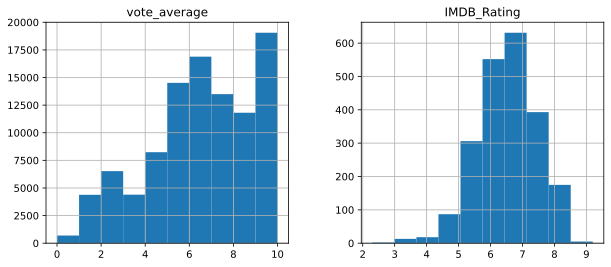

In [11]:
movies[["vote_average", "IMDB_Rating"]].hist(figsize=(10,4))

<Axes: xlabel='IMDB_Rating', ylabel='Count'>

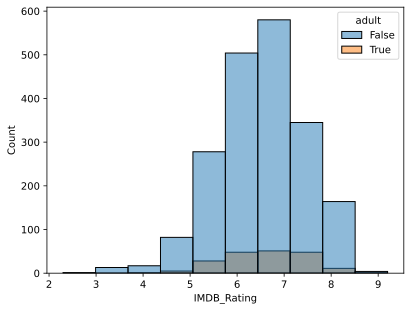

In [12]:
sns.histplot(x = "IMDB_Rating", data = movies, bins = 10, hue = 'adult')

<Axes: xlabel='Certificate', ylabel='count'>

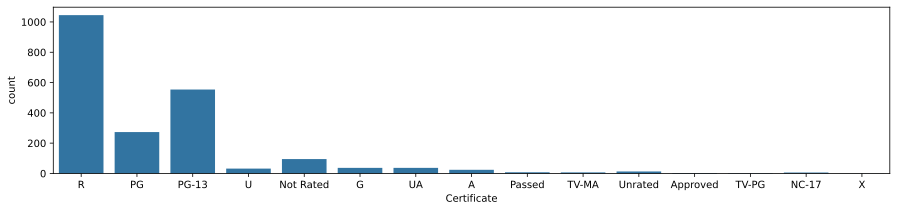

In [13]:
plt.figure(figsize = (15, 3))
sns.countplot(x = "Certificate", data = movies)

<Axes: xlabel='vote_average'>

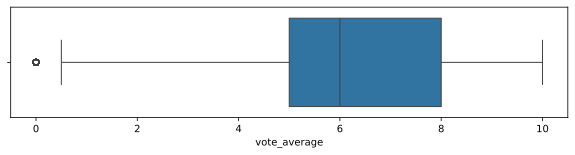

In [14]:
plt.figure(figsize = (10, 2))
# диаграмма размаха бюджетов фильмов
sns.boxplot(x = "vote_average",  data = movies)

<Axes: xlabel='status', ylabel='count'>

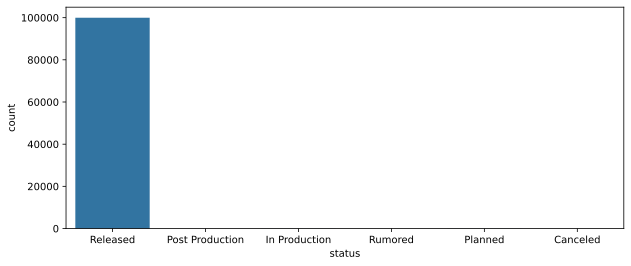

In [15]:
plt.figure(figsize = (10, 4))
# диаграмма статусов фильмов
sns.countplot(x="status", data = movies)

<Axes: xlabel='adult', ylabel='count'>

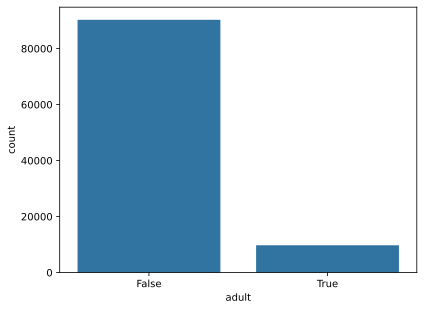

In [16]:
# диаграамма количества фильмов для детей и совершеннолетних
sns.countplot(x="adult", data = movies)

## 4. Группировка объектов

In [17]:
# Отображаем описательную статистику по группам 'status' и 'adult'
groups = movies.groupby(['status', 'adult'])   
for (status, adult), g in groups:
    print("status: {0:15}  adult: {1:5} mean budget: {2:5.2f}".format(status, adult, g["budget"].mean()))

status: Canceled         adult:     0 mean budget:  0.00
status: Canceled         adult:     1 mean budget:  0.00
status: In Production    adult:     0 mean budget: 1092324.45
status: Planned          adult:     0 mean budget:  0.00
status: Post Production  adult:     0 mean budget: 12871.43
status: Released         adult:     0 mean budget: 19848.73
status: Released         adult:     1 mean budget: 19122.96
status: Rumored          adult:     0 mean budget:  0.00


In [18]:
# Отображаем описательную статистику по группам 'Certificate'
groups = movies.groupby('Certificate')
print("Всего %d групп" % len(groups))
for Certificate, g in groups:
    print(Certificate)

Всего 15 групп
A
Approved
G
NC-17
Not Rated
PG
PG-13
Passed
R
TV-MA
TV-PG
U
UA
Unrated
X


## 5. Визуализация зависимостей показателей

In [19]:
# зависимость дохода с фильма от его оценки на IMDB
plt.figure(figsize = (10, 4))
# sns.scatterplot(x = "vote_average", y = "revenue", data = movies)

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Axes: xlabel='Certificate', ylabel='count'>

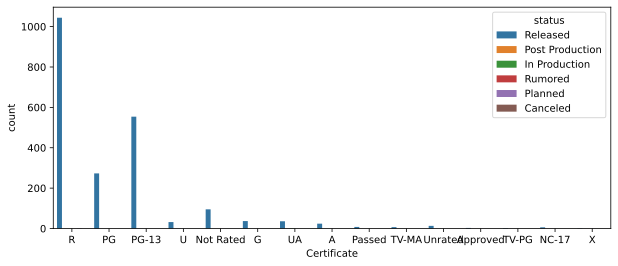

In [20]:
plt.figure(figsize = (10, 4))
# диаграммы частот с группировкой
sns.countplot(x = "Certificate", hue = "status", data = movies)

In [21]:
plt.figure(figsize = (11, 4))
# Зависимость типа свободного времени от количества пропусков
sns.stripplot(x = "runtime", y = "vote_average", data = movies)

<Axes: xlabel='runtime', ylabel='vote_average'>

## 6. Пропуски данных и аномальные выбросы

Удаление выбросов с использованием межквартильного размаха (IQR)

<Axes: xlabel='IMDB_Rating'>

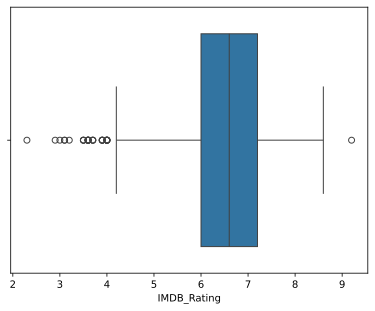

In [22]:
sns.boxplot(x = "IMDB_Rating",  data = movies)

<Axes: xlabel='IMDB_Rating'>

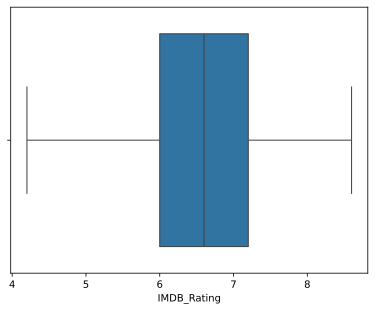

In [23]:
# Рассчёт квартилей и IQR
Q1 = movies['IMDB_Rating'].quantile(0.25)
Q3 = movies['IMDB_Rating'].quantile(0.75)
IQR = Q3 - Q1

# Установление границ для удаления выбросов
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
# Фильтрация значений бюджета, которые не выходят за границы IQR
movies_cleaned = movies[(movies['IMDB_Rating'] >= lower_bound) & (movies['IMDB_Rating'] <= upper_bound)]
sns.boxplot(x = "IMDB_Rating",  data = movies_cleaned)